# Importing the necessary dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import obspy
from obspy.clients.fdsn import Client
from obspy import UTCDateTime
from glob import glob
from tqdm import tqdm

In [2]:
client = Client('IRIS')

In [416]:
import obspy
from obspy.clients.fdsn.mass_downloader import CircularDomain, \
    Restrictions, MassDownloader

origin_time = obspy.UTCDateTime(2021,8,26,8,59,50)

# Circular domain around the epicenter. This will download all data between
# 0 and 1degrees distance from the epicenter. This module also offers
# rectangular and global domains. More complex domains can be defined by
# inheriting from the Domain class.
domain = CircularDomain(latitude= 44.760, longitude=-110.715,
                        minradius=0, maxradius=0.4)

restrictions = Restrictions(
    # Get data from 5 minutes before the event to one hour after the
    # event. This defines the temporal bounds of the waveform data.
    starttime=origin_time - 1*60,
    endtime=origin_time + 300,
    # You might not want to deal with gaps in the data. If this setting is
    # True, any trace with a gap/overlap will be discarded.
    reject_channels_with_gaps=True,
    # And you might only want waveforms that have data for at least 95 % of
    # the requested time span. Any trace that is shorter than 95 % of the
    # desired total duration will be discarded.https://ds.iris.edu/gmap/#starttime=2021-08-26&endtime=2021-08-31&latitude=44.76&longitude=-110.715&maxradius=0.2&network=*&drawingmode=radial&planet=earth
    minimum_length=0.95,
    # No two stations should be closer than 10 km to each other. This is
    # useful to for example filter out stations that are part of different
    # networks but at the same physical station. Settings this option to
    # zero or None will disable that filtering.
    minimum_interstation_distance_in_m=0,
    # Only HH or BH channels. If a station has HH channels, those will be
    # downloaded, otherwise the BH. Nothing will be downloaded if it has
    # neither. You can add more/less patterns if you like.
    channel_priorities=["EH[ZNE12]", "HH[ZNE12]","BH[ZNE12]"],
    # Location codes are arbitrary and there is no rule as to which
    # location is best. Same logic as for the previous setting.
    location_priorities=["","01", "00", "10"])

# No specified providers will result in all known ones being queried.
mdl = MassDownloader()
# The data will be downloaded to the ``./waveforms/`` and ``./stations/``
# folders with automatically chosen file names.
mdl.download(domain, restrictions, mseed_storage="waveforms",
             stationxml_storage="stations")



[2021-11-26 11:41:57,523] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for BGR, EMSC, ETH, GEONET, GFZ, ICGC, INGV, IPGP, ISC, KNMI, KOERI, LMU, NCEDC, NIEP, NOA, RESIF, SCEDC, TEXNET, UIB-NORSAR, USGS, USP, ORFEUS, IRIS.
[2021-11-26 11:41:57,546] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'EMSC' as it does not have 'dataselect' and/or 'station' services.
[2021-11-26 11:41:57,561] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'ISC' as it does not have 'dataselect' and/or 'station' services.
[2021-11-26 11:41:57,612] - obspy.clients.fdsn.mass_downloader - INFO: Cannot use client 'USGS' as it does not have 'dataselect' and/or 'station' services.
[2021-11-26 11:41:57,624] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 20 client(s): BGR, ETH, GEONET, GFZ, ICGC, INGV, IPGP, KNMI, KOERI, LMU, NCEDC, NIEP, NOA, RESIF, SCEDC, TEXNET, UIB-NORSAR, USP, ORFEUS, IRIS.
[2021-11-26 11:41:57,627] - obspy.clients.f

[2021-11-26 11:43:00,785] - obspy.clients.fdsn.mass_downloader - INFO: Client 'RESIF' - No data available for request.
[2021-11-26 11:43:00,787] - obspy.clients.fdsn.mass_downloader - INFO: Client 'RESIF' - No data available.
[2021-11-26 11:43:00,789] - obspy.clients.fdsn.mass_downloader - INFO: Total acquired or preexisting stations: 0
[2021-11-26 11:43:00,790] - obspy.clients.fdsn.mass_downloader - INFO: Client 'SCEDC' - Requesting unreliable availability.
[2021-11-26 11:43:34,098] - obspy.clients.fdsn.mass_downloader - INFO: Client 'SCEDC' - Successfully requested availability (33.31 seconds)
[2021-11-26 11:43:34,226] - obspy.clients.fdsn.mass_downloader - INFO: Client 'SCEDC' - Found 6 stations (18 channels).
[2021-11-26 11:43:34,228] - obspy.clients.fdsn.mass_downloader - INFO: Client 'SCEDC' - Will attempt to download data from 6 stations.
[2021-11-26 11:43:34,230] - obspy.clients.fdsn.mass_downloader - INFO: Client 'SCEDC' - Status for 18 time intervals/channels before downloadi

[2021-11-26 11:45:20,193] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations/WY.YNR.xml'.
[2021-11-26 11:45:20,783] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations/WY.YPC.xml'.
[2021-11-26 11:45:20,787] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Successfully downloaded 'stations/WY.YMV.xml'.
[2021-11-26 11:45:20,825] - obspy.clients.fdsn.mass_downloader - INFO: Client 'IRIS' - Downloaded 26 station files [0.4 MB] in 11.4 seconds [33.81 KB/sec].
[2021-11-26 11:45:20,827] - obspy.clients.fdsn.mass_downloader - INFO: ============================== Final report
[2021-11-26 11:45:20,827] - obspy.clients.fdsn.mass_downloader - INFO: 0 MiniSEED files [0.0 MB] already existed.
[2021-11-26 11:45:20,828] - obspy.clients.fdsn.mass_downloader - INFO: 0 StationXML files [0.0 MB] already existed.
[2021-11-26 11:45:20,829] - obspy.clients.fdsn.mass_downloader - INFO: Client 'BGR' - Acquired 0 

{'BGR': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbab2998190>,
 'ETH': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbab1e2b6a0>,
 'GEONET': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbab1f94070>,
 'GFZ': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbab1f55ee0>,
 'ICGC': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbab1e78700>,
 'INGV': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fba70528910>,
 'IPGP': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbbd644d5e0>,
 'KNMI': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbbd644d2e0>,
 'KOERI': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownloadHelper at 0x7fbbd6108370>,
 'LMU': <obspy.clients.fdsn.mass_downloader.download_helpers.ClientDownlo

In [3]:
files = glob('waveforms/*')
files_inv = glob('stations/*')
len(files)
len(files_inv)

26

In [4]:
s = obspy.Stream()
inv = obspy.Inventory()
for i in tqdm(range(len(files))):
    s += obspy.read(files[i])
    
for i in range(len(files_inv)):
    inv += obspy.read_inventory(files_inv[i])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 59.79it/s]


In [5]:
#plt.style.use('ggplot')
#s.plot(equal_scale=False,show=False)

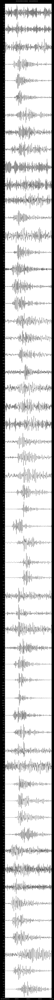

In [6]:
origin_time = obspy.UTCDateTime(2021,8,26,8,59,50)
s1 = s.copy()
s1.filter(type='bandpass',freqmin=0.5,freqmax=3)
s1.trim(origin_time,origin_time+40)
plt.style.use('dark_background')
s1.plot(equal_scale=False,show=False)

In [7]:
plt.style.use('ggplot')
snr = []
for i in range(len(s1)):
    rms_noise = np.sqrt(np.mean((s1[i].data[0:5*int(s1[i].stats.sampling_rate)])**2))
    rms_signal = np.sqrt(np.mean((s1[i].data[10*int(s1[i].stats.sampling_rate):15*int(s1[i].stats.sampling_rate)])**2))
    snr.append(rms_signal/rms_noise)

/tmp/ipykernel_78329/1855591272.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=[12,3])


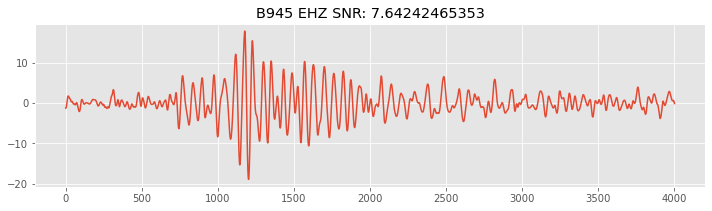

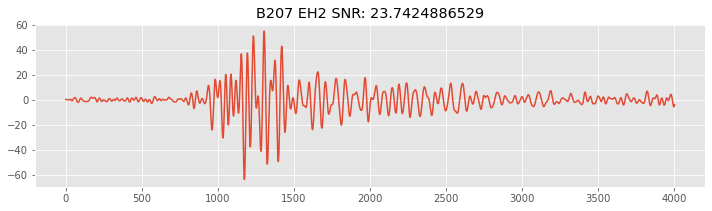

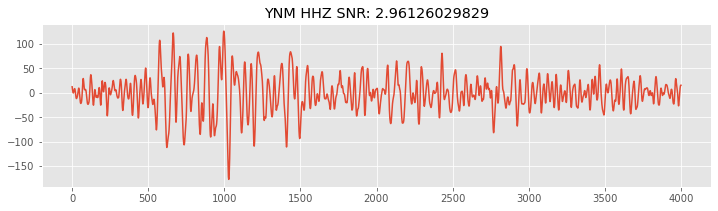

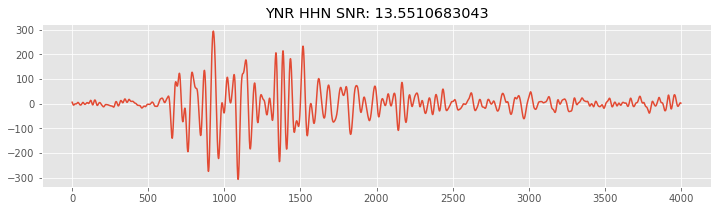

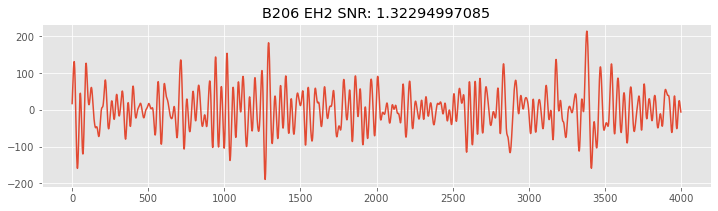

...

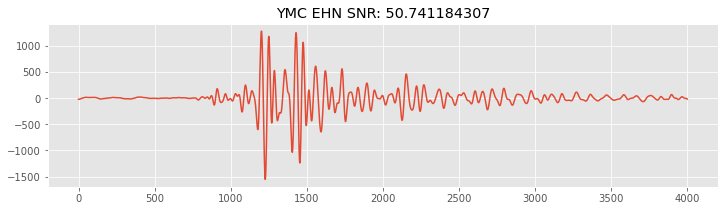

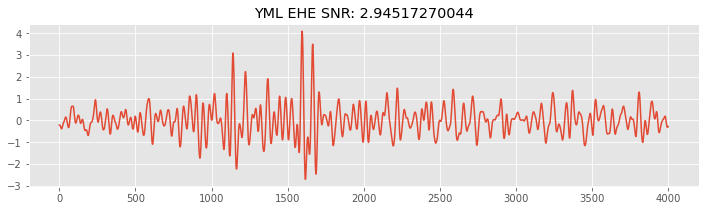

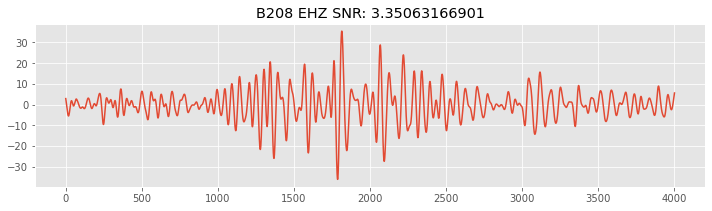

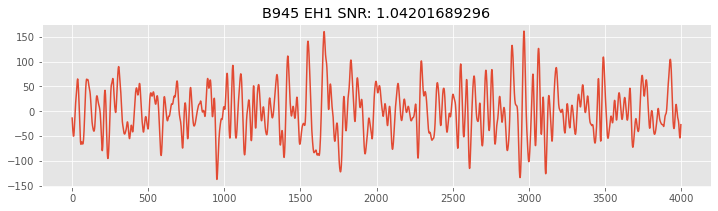

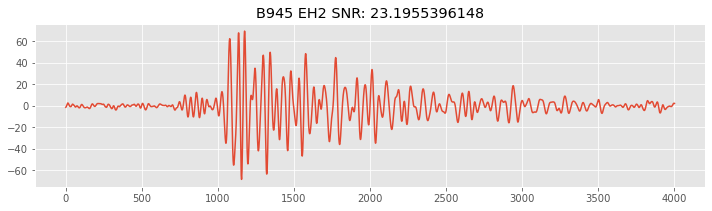

In [8]:
for i in range(len(s1)):
    plt.figure(figsize=[12,3])
    plt.plot(s1[i].data)
    plt.title(s1[i].stats.station+' '+s1[i].stats.channel+' '+'SNR: '+str(snr[i]),color='black')

Text(0.5, 0, 'Traces')

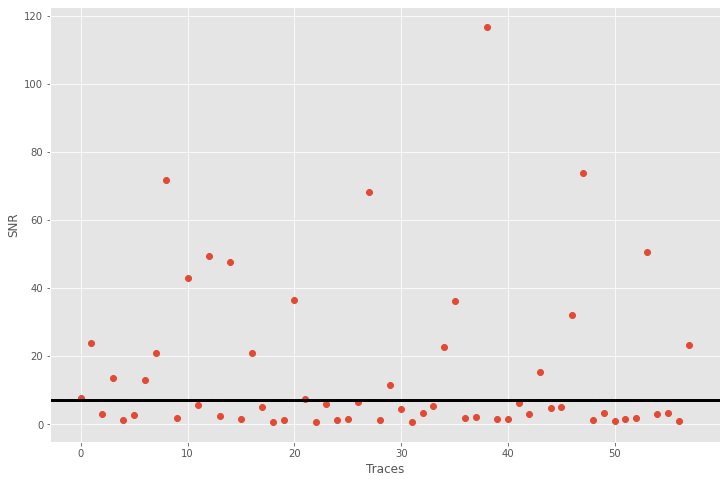

In [9]:
plt.figure(figsize=[12,8])
plt.plot(range(len(s1)),snr,'o')
plt.axhline(7,lw=3,c='k')
plt.ylabel('SNR')
plt.xlabel('Traces')

In [10]:
snr_criteria = 7

In [12]:
good_s = np.array(s)[np.array(snr)>snr_criteria]
good_snr = np.array(snr)[np.array(snr)>snr_criteria]

/tmp/ipykernel_839632/913079136.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  good_s = np.array(s)[np.array(snr)>snr_criteria]


/tmp/ipykernel_839632/1154476645.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=[15,3])


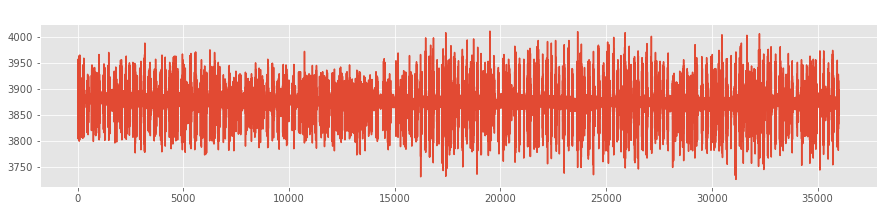

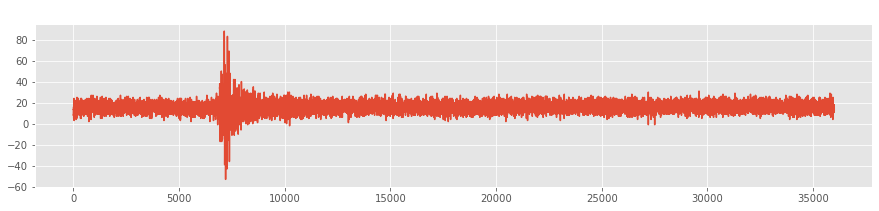

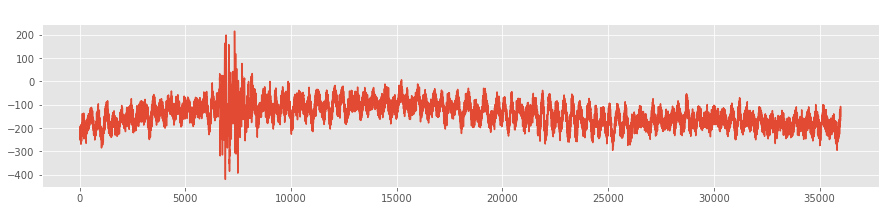

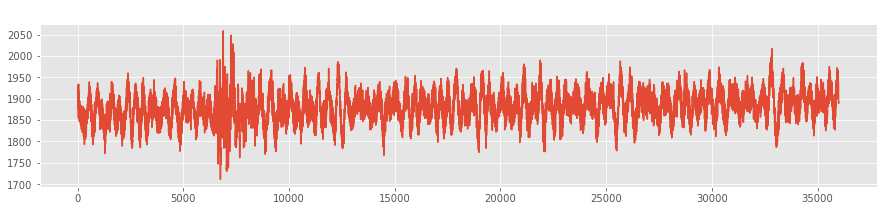

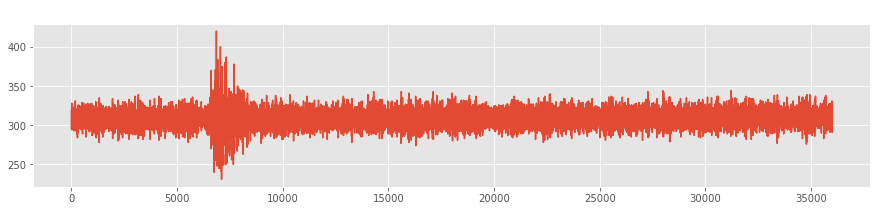

...

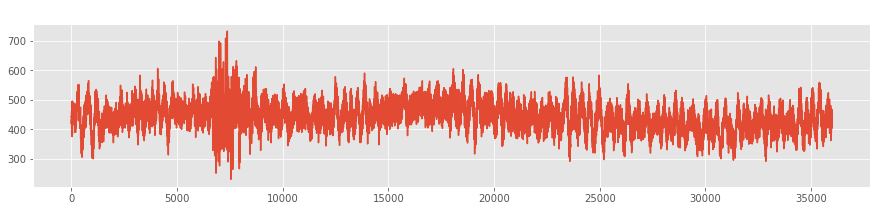

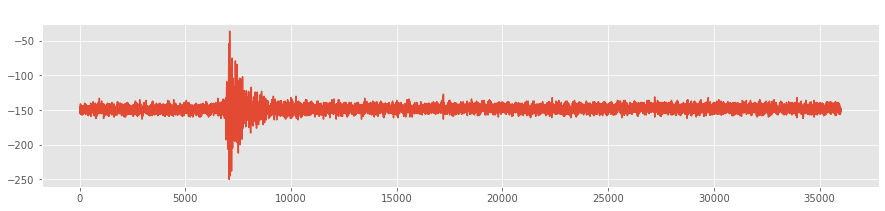

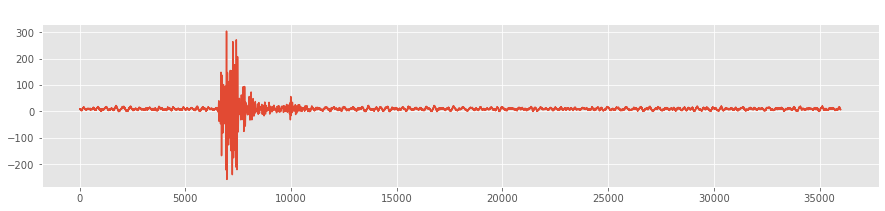

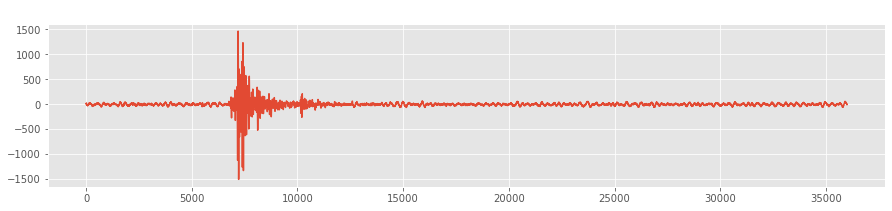

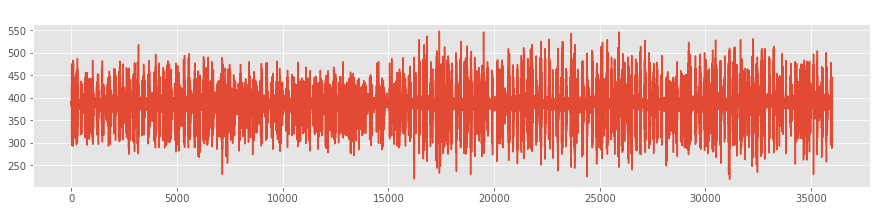

In [13]:
for i in range(len(good_s)):
    plt.figure(figsize=[15,3])
    plt.plot(good_s[i].data)
    plt.title(good_s[i].stats.station+' '+good_s[i].stats.channel+' '+'SNR: '+str(good_snr[i]))

In [16]:
nice_s = obspy.Stream()
for i in range(len(good_s)):
    nice_s += good_s[i]

In [18]:
nice_stns = []
for i in range(len(nice_s)):
    nice_stns.append(nice_s[i].stats.station)

In [61]:
nice_s = obspy.Stream([])
nice_s_inv = obspy.Inventory()
for stn in np.unique(nice_stns):
    nice_s += s.select(station=stn)
    nice_s_inv += inv.select(station=stn)

In [43]:
nice_s

25 Trace(s) in Stream:

PB.B207..EH2 | 2021-08-26T08:58:50.008400Z - 2021-08-26T09:04:49.998400Z | 100.0 Hz, 36000 samples
...
(23 other traces)
...
WY.YWB.01.EHZ | 2021-08-26T08:58:50.000000Z - 2021-08-26T09:04:50.000000Z | 100.0 Hz, 36001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [44]:
nice_s

25 Trace(s) in Stream:

PB.B207..EH2 | 2021-08-26T08:58:50.008400Z - 2021-08-26T09:04:49.998400Z | 100.0 Hz, 36000 samples
...
(23 other traces)
...
WY.YWB.01.EHZ | 2021-08-26T08:58:50.000000Z - 2021-08-26T09:04:50.000000Z | 100.0 Hz, 36001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

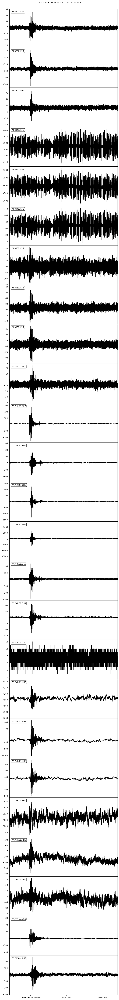

In [47]:
plt.style.use('default')
nice_s.plot(equal_scale=False,show=False)

In [103]:
nice_s_z = nice_s.select(channel='*HZ')
nice_s_inv_z = nice_s_inv.select(channel="*HZ")
nice_s_1 = nice_s.select(channel='*H1')
nice_s_inv_1 = nice_s_inv.select(channel="*H1")
nice_s_2 = nice_s.select(channel='*H2')
nice_s_inv_2 = nice_s_inv.select(channel="*H2")
nice_s_N = nice_s.select(channel='*HN')
nice_s_inv_N = nice_s_inv.select(channel="*HN")
nice_s_E = nice_s.select(channel='*HE')
nice_s_inv_E = nice_s_inv.select(channel="*HE")
nice_s_North = nice_s_1+nice_s_N
nice_s_East = nice_s_2+nice_s_E
nice_s_inv_North = nice_s_inv_1+nice_s_inv_N
nice_s_inv_East = nice_s_inv_2+nice_s_inv_E

In [104]:
for i in range(len(nice_s_z)):
    nice_s_z[i].stats.latitude = nice_s_inv_z.select(station = nice_s_z[i].stats.station)[0][0].latitude
    nice_s_z[i].stats.longitude = nice_s_inv_z.select(station = nice_s_z[i].stats.station)[0][0].longitude
    
for i in range(len(nice_s_North)):
    nice_s_North[i].stats.latitude = nice_s_inv_North.select(station = nice_s_North[i].stats.station)[0][0].latitude
    nice_s_North[i].stats.longitude = nice_s_inv_North.select(station = nice_s_North[i].stats.station)[0][0].longitude
    
for i in range(len(nice_s_East)):
    nice_s_East[i].stats.latitude = nice_s_inv_East.select(station = nice_s_East[i].stats.station)[0][0].latitude
    nice_s_East[i].stats.longitude = nice_s_inv_East.select(station = nice_s_East[i].stats.station)[0][0].longitude


In [112]:
from obspy.geodetics.base import gps2dist_azimuth
dlf_lat, dlf_lon = 44.760,-110.715
nice_s = nice_s_z+nice_s_North+nice_s_East

In [115]:
for i in range(len(nice_s)):
    lat = nice_s[i].stats.latitude
    lon = nice_s[i].stats.longitude
    nice_s[i].stats.back_azimuth = gps2dist_azimuth(lat,lon,dlf_lat,dlf_lon)[1]
    nice_s[i].stats.distance = gps2dist_azimuth(lat,lon,dlf_lat,dlf_lon)[0]/1000
    

In [116]:
stns = []
channels = []
locs = []
network = []

for i in range(len(nice_s)):
    stns.append(nice_s[i].stats.station)
    channels.append(nice_s[i].stats.channel)
    locs.append(nice_s[i].stats.location)
    network.append(nice_s[i].stats.network)

In [117]:
## Downloading waveforms for Typical event. 

lat_te = 44.781
lon_te = -110.789
st_time = UTCDateTime(2021,8,25,18,1,34)

s_te = obspy.Stream()

for i in tqdm(range(len(stns))):
    s_te += client.get_waveforms(network = network[i], station = stns[i],location=locs[i],channel=channels[i],
                             starttime=st_time-60,endtime=st_time+300)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 25/25 [00:58<00:00,  2.36s/it]


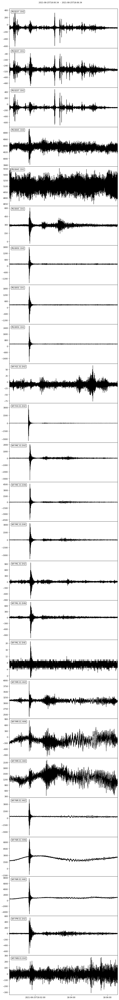

In [118]:
s_te.plot(equal_scale=False,show=False)

In [178]:
print(nice_s1.__str__(extended=True))

25 Trace(s) in Stream:
PB.B207..EHZ  | 2021-08-26T08:59:49.998400Z - 2021-08-26T09:00:29.998400Z | 100.0 Hz, 4001 samples
PB.B945..EHZ  | 2021-08-26T08:59:49.998400Z - 2021-08-26T09:00:29.998400Z | 100.0 Hz, 4001 samples
PB.B950..EHZ  | 2021-08-26T08:59:49.998400Z - 2021-08-26T09:00:29.998400Z | 100.0 Hz, 4001 samples
WY.YGC.01.EHZ | 2021-08-26T08:59:50.000000Z - 2021-08-26T09:00:30.000000Z | 100.0 Hz, 4001 samples
WY.YHH.01.EHZ | 2021-08-26T08:59:50.000000Z - 2021-08-26T09:00:30.000000Z | 100.0 Hz, 4001 samples
WY.YMC.01.EHZ | 2021-08-26T08:59:50.000000Z - 2021-08-26T09:00:30.000000Z | 100.0 Hz, 4001 samples
WY.YML.01.EHZ | 2021-08-26T08:59:50.000000Z - 2021-08-26T09:00:30.000000Z | 100.0 Hz, 4001 samples
WY.YMR.01.HHZ | 2021-08-26T08:59:49.998393Z - 2021-08-26T09:00:29.998393Z | 100.0 Hz, 4001 samples
WY.YNR.01.HHZ | 2021-08-26T08:59:49.998393Z - 2021-08-26T09:00:29.998393Z | 100.0 Hz, 4001 samples
WY.YPM.01.EHZ | 2021-08-26T08:59:50.000000Z - 2021-08-26T09:00:30.000000Z | 100.0 Hz, 

In [124]:
for i in range(len(nice_s)):
    s_te[i].stats.distance = nice_s[i].stats.distance
    s_te[i].stats.back_azimuth = nice_s[i].stats.back_azimuth

In [264]:
def prs(f1,f2):
    plt.style.use('dark_background')
    nice_s1 = nice_s.copy()
    s_te1 = s_te.copy()
    nice_s1.rotate(method='NE->RT')
    s_te1.rotate(method='NE->RT')
    nice_s1.filter(type='bandpass',freqmin = f1, freqmax = f2)
    s_te1.filter(type='bandpass',freqmin = f1, freqmax = f2)


    fig = plt.figure(figsize=[12,15])


    ax1 = fig.add_subplot(3,2,1)
    ylabels = []
    ycor = []

    nice_s1_z = nice_s1.select(channel='*HZ')
    nice_s1_z.trim(origin_time, origin_time+40)
    for i in range(len(nice_s1_z)):
    
        t = np.linspace(0,nice_s1_z[i].stats.npts/nice_s1_z[i].stats.sampling_rate,nice_s1_z[i].stats.npts)
        plt.plot(t,(nice_s1_z[i].data/np.max(abs(nice_s1_z[i].data[10:-1])))+nice_s1_z[i].stats.distance)
        ylabels.append(nice_s1_z[i].stats.network+'.'+nice_s1_z[i].stats.station+'.'+nice_s1_z[i].stats.channel)
        ycor.append(nice_s1_z[i].stats.distance)
    
    plt.xlim(0,40)  
    ax1.set_yticks(ticks = ycor)
    ax1.set_yticklabels(ylabels,fontsize=8)

    ax1.spines["bottom"].set_linewidth(2)
    ax1.spines["top"].set_linewidth(2)
    ax1.spines["left"].set_linewidth(2)
    ax1.spines["right"].set_linewidth(2)
    ax1.set_title('Deep Low Frequency Event  2021-08-26 08:59:50.810 Depth 14.2 Km',fontsize=10)


    ax2 = fig.add_subplot(3,2,3)
    ylabels = []
    ycor = []
    nice_s1_r = nice_s1.select(channel='*HR')
    nice_s1_r.trim(origin_time, origin_time+40)
    for i in range(len(nice_s1_r)):
    
        t = np.linspace(0,nice_s1_r[i].stats.npts/nice_s1_r[i].stats.sampling_rate,nice_s1_r[i].stats.npts)
        plt.plot(t,nice_s1_r[i].data/np.max(abs(nice_s1_r[i].data[10:-1]))+nice_s1_r[i].stats.distance)
        ylabels.append(nice_s1_r[i].stats.network+'.'+nice_s1_r[i].stats.station+'.'+nice_s1_r[i].stats.channel)
        ycor.append(nice_s1_r[i].stats.distance)
    
    plt.xlim(0,40)   
    ax2.set_yticks(ticks = ycor)
    ax2.set_yticklabels(ylabels,fontsize=10)
    ax2.spines["bottom"].set_linewidth(2)
    ax2.spines["top"].set_linewidth(2)
    ax2.spines["left"].set_linewidth(2)
    ax2.spines["right"].set_linewidth(2)
    




    ax3 = fig.add_subplot(3,2,5)
    ylabels = []
    ycor = []
    nice_s1_t = nice_s1.select(channel='*HT')
    nice_s1_t.trim(origin_time, origin_time+40)
    for i in range(len(nice_s1_t)):
    
        t = np.linspace(0,nice_s1_t[i].stats.npts/nice_s1_t[i].stats.sampling_rate,nice_s1_t[i].stats.npts)
        plt.plot(t,nice_s1_t[i].data/np.max(abs(nice_s1_t[i].data[10:-1]))+nice_s1_t[i].stats.distance)
        ylabels.append(nice_s1_t[i].stats.network+'.'+nice_s1_t[i].stats.station+'.'+nice_s1_t[i].stats.channel)
        ycor.append(nice_s1_t[i].stats.distance) 
    
    plt.xlim(0,40)
    ax3.set_yticks(ticks = ycor)
    ax3.set_yticklabels(ylabels,fontsize=10)
    ax3.spines["bottom"].set_linewidth(2)
    ax3.spines["top"].set_linewidth(2)
    ax3.spines["left"].set_linewidth(2)
    ax3.spines["right"].set_linewidth(2)



    ax4 = fig.add_subplot(3,2,2)
    s_te1_z = s_te1.select(channel='*HZ')
    s_te1_z.trim(st_time, st_time+40)
    for i in range(len(s_te1_z)):
    
        t = np.linspace(0,s_te1_z[i].stats.npts/s_te1_z[i].stats.sampling_rate,s_te1_z[i].stats.npts)
        plt.plot(t,s_te1_z[i].data/np.max(abs(s_te1_z[i].data[10:-1]))+s_te1_z[i].stats.distance)
    
    plt.xlim(0,40)
    plt.yticks([])
    
    ax4.spines["bottom"].set_linewidth(2)
    ax4.spines["top"].set_linewidth(2)
    ax4.spines["left"].set_linewidth(2)
    ax4.spines["right"].set_linewidth(2)
    
    ax4.set_title('Typical Event 2021-08-25 18:01:34.750 Depth 2Km',fontsize=10)


    ax5 = fig.add_subplot(3,2,4)
    s_te1_r = s_te1.select(channel='*HR')
    s_te1_r.trim(st_time, st_time+40)
    for i in range(len(s_te1_r)):
    
        t = np.linspace(0,s_te1_r[i].stats.npts/s_te1_r[i].stats.sampling_rate,s_te1_r[i].stats.npts)
        plt.plot(t,s_te1_r[i].data/np.max(abs(s_te1_r[i].data[10:-1]))+s_te1_r[i].stats.distance)
    
    plt.xlim(0,40)
    plt.yticks([])
    
    ax5.spines["bottom"].set_linewidth(2)
    ax5.spines["top"].set_linewidth(2)
    ax5.spines["left"].set_linewidth(2)
    ax5.spines["right"].set_linewidth(2)

    ax6 = fig.add_subplot(3,2,6)
    ycor = []
    ylabels = []
    s_te1_t = s_te1.select(channel='*HT')
    s_te1_t.trim(st_time, st_time+40)
    for i in range(len(s_te1_t)):
    
        t = np.linspace(0,s_te1_t[i].stats.npts/s_te1_t[i].stats.sampling_rate,s_te1_t[i].stats.npts)
        plt.plot(t,s_te1_t[i].data/np.max(abs(s_te1_t[i].data[10:-1]))+s_te1_t[i].stats.distance)


    plt.yticks([])
    plt.xlim(0,40)

    ax6.spines["bottom"].set_linewidth(2)
    ax6.spines["top"].set_linewidth(2)
    ax6.spines["left"].set_linewidth(2)
    ax6.spines["right"].set_linewidth(2)
    
    fig.supxlabel('Time since origin(s)',fontsize=20)
    fig.suptitle('Filter '+str(f1)+'-'+str(f2)+'Hz',fontsize=30,y=1)

    fig.tight_layout()

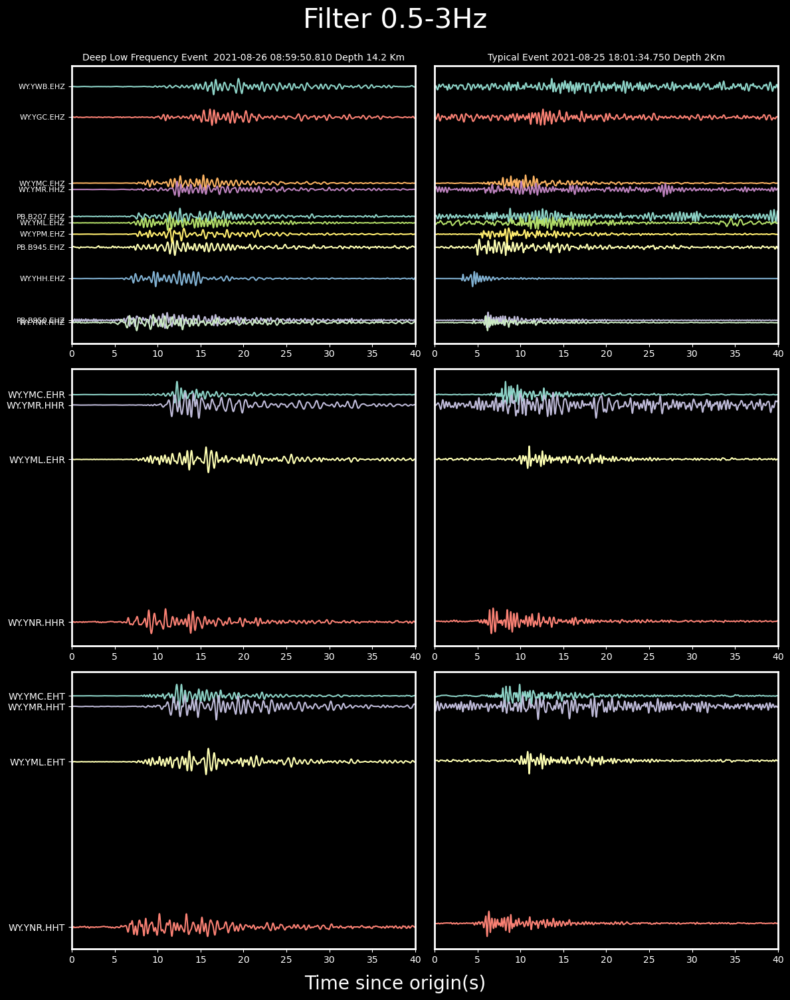

In [265]:
prs(f1=0.5,f2=3)

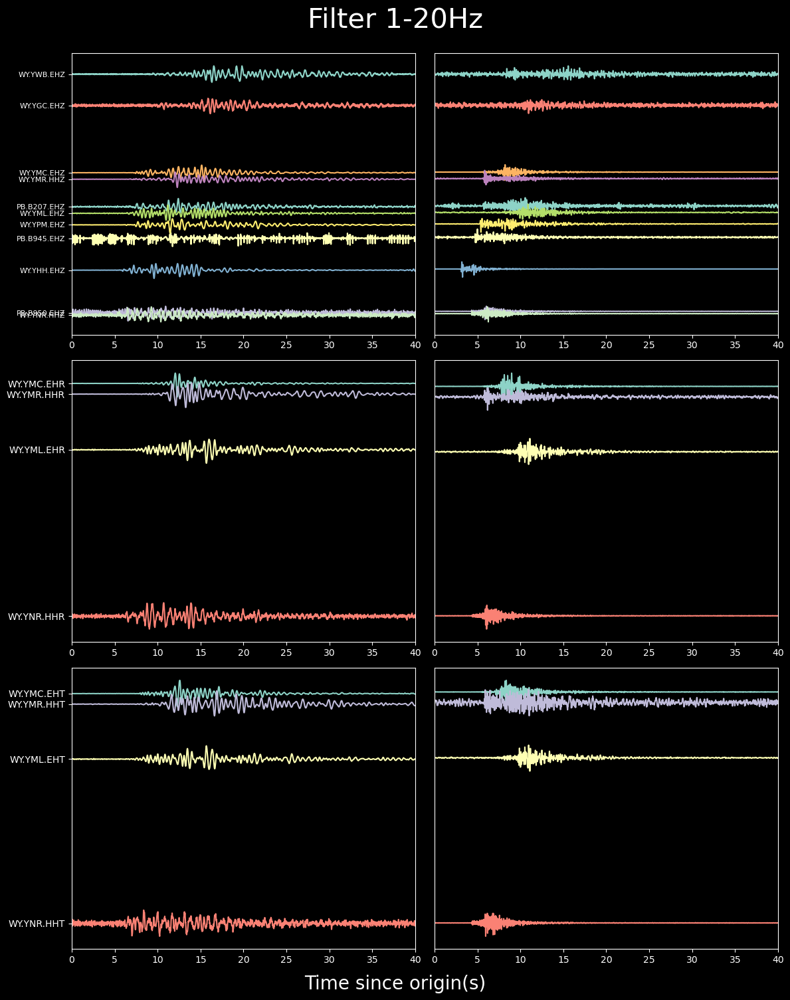

In [199]:
prs(f1=1,f2=20)

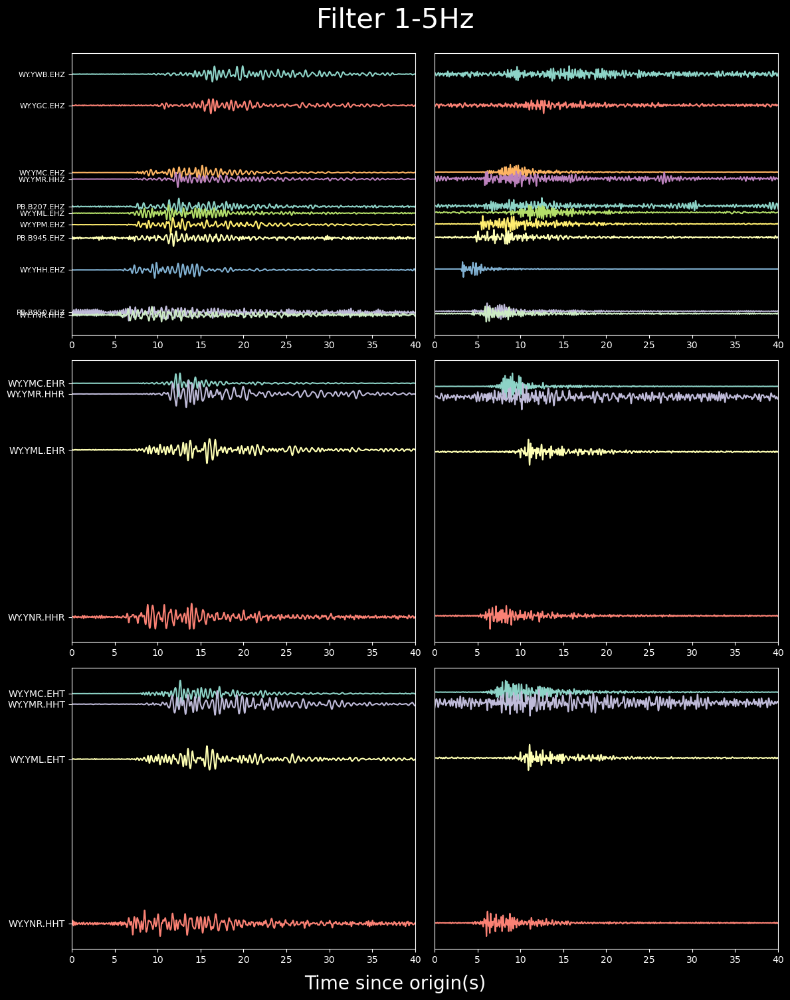

In [200]:
prs(1,5)

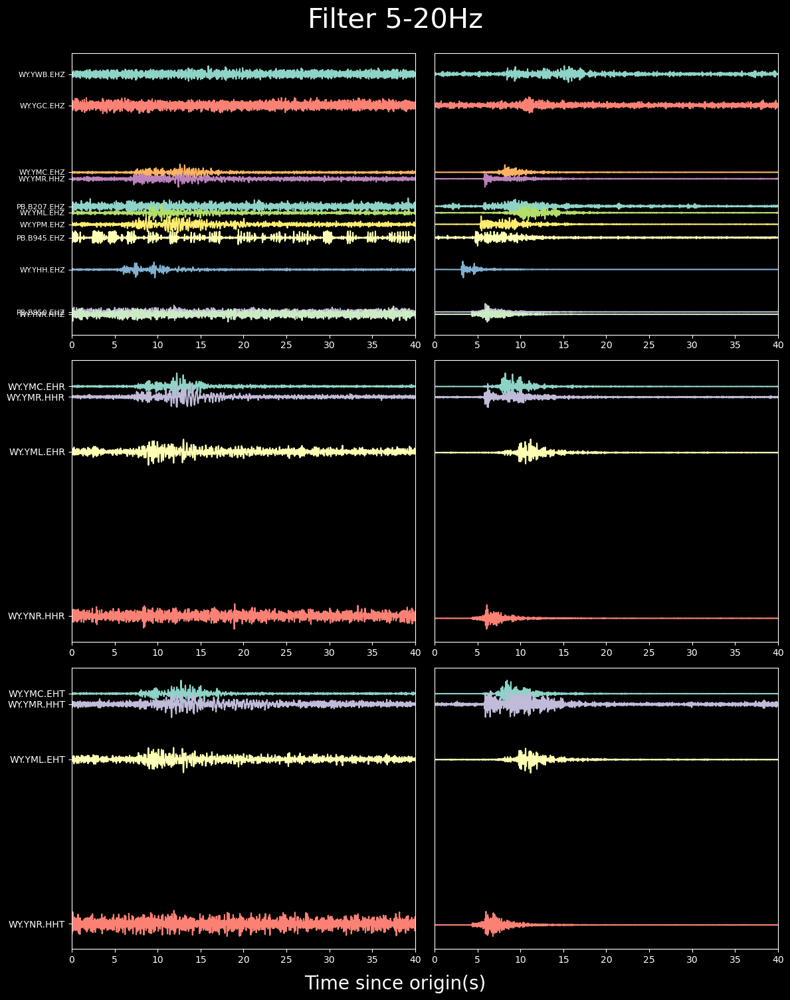

In [201]:
prs(5,20)

In [551]:
s_te1 = s_te.copy()
s_te1.taper(type='hann',max_percentage=0.5)
s_te1.trim(starttime=st_time,endtime=st_time+40)
s_te1.filter(type='bandpass',freqmin=0.5,freqmax=3,corners=4,zerophase=True)


22 Trace(s) in Stream:

PB.B945..EHZ | 2021-08-25T18:01:33.998400Z - 2021-08-25T18:02:13.998400Z | 100.0 Hz, 4001 samples
...
(20 other traces)
...
PB.B945..EH2 | 2021-08-25T18:01:33.998400Z - 2021-08-25T18:02:13.998400Z | 100.0 Hz, 4001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [552]:
nice_s1 = nice_s.copy()
nice_s1.taper(type='hann',max_percentage=0.5)
nice_s1.trim(starttime=origin_time,endtime=origin_time+40)
nice_s1.filter(type='bandpass',freqmin=1,freqmax=20,corners=4,zerophase=True)

22 Trace(s) in Stream:

PB.B945..EHZ | 2021-08-26T08:59:49.998400Z - 2021-08-26T09:00:29.998400Z | 100.0 Hz, 4001 samples
...
(20 other traces)
...
PB.B945..EH2 | 2021-08-26T08:59:49.998400Z - 2021-08-26T09:00:29.998400Z | 100.0 Hz, 4001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [ ]:
plt.style.use('dark_background')
fig, [ax1,ax2] = plt.subplots(1,2,figsize=[20,15],sharey=True)
ylabels = []
ycor = []
for i,stn in enumerate(np.unique(stns)):
    a = nice_s1.select(station=stn)
    a.sort()
    for k in range(len(a)):
        t = np.linspace(0,len(a[k].data)/a[k].stats.sampling_rate,len(a[k].data))
        ax1.plot(t,1.5*a[k].data/np.max(np.abs(a[k].data[10:-1]))+2*k+8*i)
        
        #plt.text(500,k+3*i+0.5,stn+'.'+a[k].stats.channel)
        ylabels.append(a[k].stats.network+'.'+stn+'.'+a[k].stats.channel)
        ycor.append(2*k+8*i)
        
        
    a = s_te1.select(station=stn)
    a.sort()
    for k in range(len(a)):
        t = np.linspace(0,len(a[k].data)/a[k].stats.sampling_rate,len(a[k].data))
        ax2.plot(t,1.5*a[k].data/np.max(np.abs(a[k].data[10:-1]))+3*k+8*i)
        
        #plt.text(500,k+3*i+0.5,stn+'.'+a[k].stats.channel)
        #ylabels.append(a[k].stats.network+'.'+stn+'.'+a[k].stats.channel)
        #ycor.append(2*k+8*i)
        
        
ax1.set_yticks(ticks = ycor)
ax1.set_yticklabels(ylabels,fontsize=20)
ax1.spines["bottom"].set_linewidth(3)
ax1.spines["top"].set_linewidth(3)
ax1.spines["left"].set_linewidth(3)
ax1.spines["right"].set_linewidth(3)

ax2.spines["bottom"].set_linewidth(3)
ax2.spines["top"].set_linewidth(3)
ax2.spines["left"].set_linewidth(3)
ax2.spines["right"].set_linewidth(3)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1.set_title('Deep Low Frequency Event  2021-08-26 08:59:50.810 Depth 14.2 Km',fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax2.set_title('Typical Event 2021-08-25 18:01:34.750 Depth 2Km',fontsize=18)
#ax1.set_xticks(size=20)
fig.supxlabel('Time since origin(s)',fontsize=20)
fig.suptitle('Filter 0.5-3 Hz',fontsize=30,y=1)
ax1.set_xlim(0,40)
ax2.set_xlim(0,40)
        #plt.ylabel(xlabels )
#plt.yticks(rotation=90)
plt.tight_layout()

(0.0, 40.0)

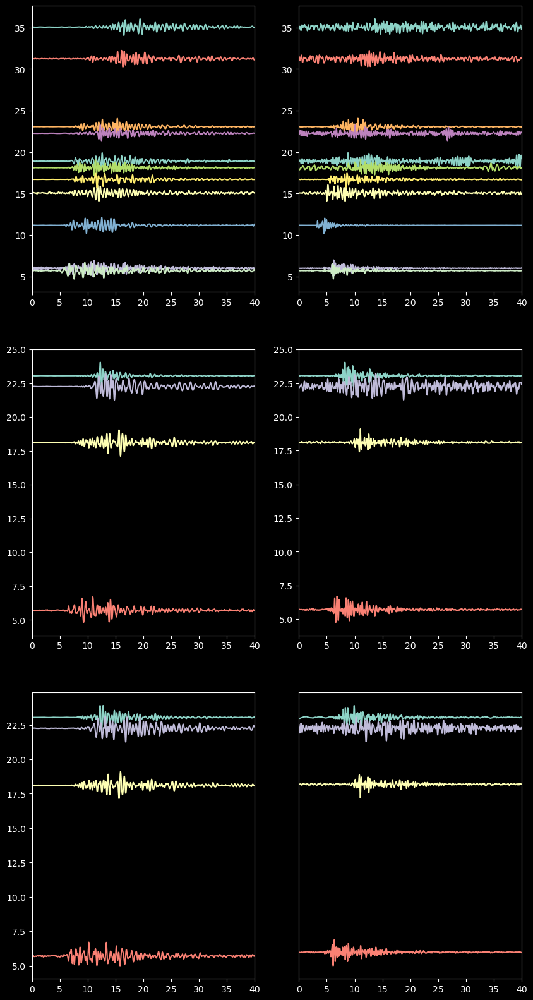

In [165]:
plt.style.use('dark_background')
nice_s1 = nice_s.copy()
s_te1 = s_te.copy()
nice_s1.rotate(method='NE->RT')
s_te1.rotate(method='NE->RT')

s_te1.filter(type='bandpass',freqmin=0.5,freqmax=3)
nice_s1.filter(type='bandpass',freqmin=0.5,freqmax=3)

fig = plt.figure(figsize=[10,20])

fig.add_subplot(3,2,1)
nice_s1_z = nice_s1.select(channel='*HZ')
nice_s1_z.trim(origin_time, origin_time+40)
for i in range(len(nice_s1_z)):
    
    t = np.linspace(0,nice_s1_z[i].stats.npts/nice_s1_z[i].stats.sampling_rate,nice_s1_z[i].stats.npts)
    plt.plot(t,nice_s1_z[i].data/np.max(abs(nice_s1_z[i].data[10:-1]))+nice_s1_z[i].stats.distance)
    
plt.xlim(0,40)  

fig.add_subplot(3,2,3)
nice_s1_r = nice_s1.select(channel='*HR')
nice_s1_r.trim(origin_time, origin_time+40)
for i in range(len(nice_s1_r)):
    
    t = np.linspace(0,nice_s1_r[i].stats.npts/nice_s1_r[i].stats.sampling_rate,nice_s1_r[i].stats.npts)
    plt.plot(t,nice_s1_r[i].data/np.max(abs(nice_s1_r[i].data[10:-1]))+nice_s1_r[i].stats.distance)
    
plt.xlim(0,40)   

fig.add_subplot(3,2,5)
nice_s1_t = nice_s1.select(channel='*HT')
nice_s1_t.trim(origin_time, origin_time+40)
for i in range(len(nice_s1_t)):
    
    t = np.linspace(0,nice_s1_t[i].stats.npts/nice_s1_t[i].stats.sampling_rate,nice_s1_t[i].stats.npts)
    plt.plot(t,nice_s1_t[i].data/np.max(abs(nice_s1_t[i].data[10:-1]))+nice_s1_t[i].stats.distance)
    
plt.xlim(0,40)





fig.add_subplot(3,2,2)
s_te1_z = s_te1.select(channel='*HZ')
s_te1_z.trim(st_time, st_time+40)
for i in range(len(s_te1_z)):
    
    t = np.linspace(0,s_te1_z[i].stats.npts/s_te1_z[i].stats.sampling_rate,s_te1_z[i].stats.npts)
    plt.plot(t,s_te1_z[i].data/np.max(abs(s_te1_z[i].data[10:-1]))+s_te1_z[i].stats.distance)
    
plt.xlim(0,40)  

fig.add_subplot(3,2,4)
s_te1_r = s_te1.select(channel='*HR')
s_te1_r.trim(st_time, st_time+40)
for i in range(len(s_te1_r)):
    
    t = np.linspace(0,s_te1_r[i].stats.npts/s_te1_r[i].stats.sampling_rate,s_te1_r[i].stats.npts)
    plt.plot(t,s_te1_r[i].data/np.max(abs(s_te1_r[i].data[10:-1]))+s_te1_r[i].stats.distance)
    
plt.xlim(0,40)  

fig.add_subplot(3,2,6)
s_te1_t = s_te1.select(channel='*HT')
s_te1_t.trim(st_time, st_time+40)
for i in range(len(s_te1_t)):
    
    t = np.linspace(0,s_te1_t[i].stats.npts/s_te1_t[i].stats.sampling_rate,s_te1_t[i].stats.npts)
    plt.plot(t,s_te1_t[i].data/np.max(abs(s_te1_t[i].data[10:-1]))+s_te1_t[i].stats.distance)

plt.yticks([])
plt.xlim(0,40)  

(0.0, 35000.0)

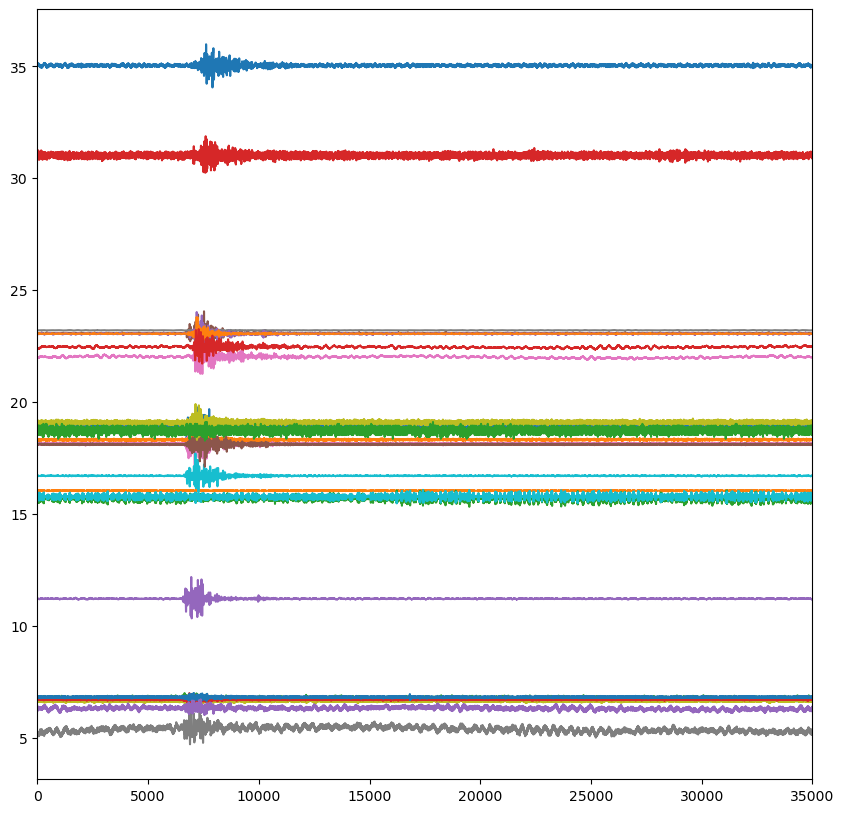

In [138]:
plt.figure(figsize=[10,10])

for i in range(len(nice_s)):
    plt.plot(nice_s[i].data/np.max(abs(nice_s[i].data))+nice_s[i].stats.distance)
plt.xlim(0,35000)

In [133]:
nice_s[i].stats.distance

18.907756624207025

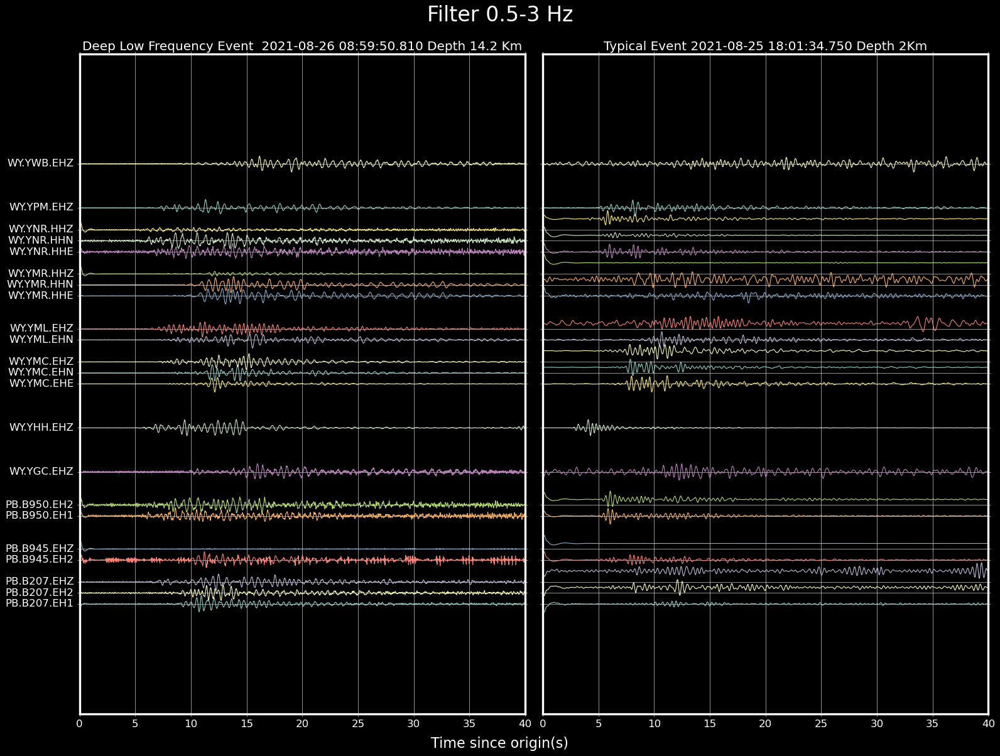

In [553]:
plt.style.use('dark_background')
fig, [ax1,ax2] = plt.subplots(1,2,figsize=[20,15],sharey=True)
ylabels = []
ycor = []
for i,stn in enumerate(np.unique(stns)):
    a = nice_s1.select(station=stn)
    a.sort()
    for k in range(len(a)):
        t = np.linspace(0,len(a[k].data)/a[k].stats.sampling_rate,len(a[k].data))
        ax1.plot(t,1.5*a[k].data/np.max(np.abs(a[k].data[10:-1]))+2*k+8*i)
        
        #plt.text(500,k+3*i+0.5,stn+'.'+a[k].stats.channel)
        ylabels.append(a[k].stats.network+'.'+stn+'.'+a[k].stats.channel)
        ycor.append(2*k+8*i)
        
        
    a = s_te1.select(station=stn)
    a.sort()
    for k in range(len(a)):
        t = np.linspace(0,len(a[k].data)/a[k].stats.sampling_rate,len(a[k].data))
        ax2.plot(t,1.5*a[k].data/np.max(np.abs(a[k].data[10:-1]))+3*k+8*i)
        
        #plt.text(500,k+3*i+0.5,stn+'.'+a[k].stats.channel)
        #ylabels.append(a[k].stats.network+'.'+stn+'.'+a[k].stats.channel)
        #ycor.append(2*k+8*i)
        
        
ax1.set_yticks(ticks = ycor)
ax1.set_yticklabels(ylabels,fontsize=20)
ax1.spines["bottom"].set_linewidth(3)
ax1.spines["top"].set_linewidth(3)
ax1.spines["left"].set_linewidth(3)
ax1.spines["right"].set_linewidth(3)

ax2.spines["bottom"].set_linewidth(3)
ax2.spines["top"].set_linewidth(3)
ax2.spines["left"].set_linewidth(3)
ax2.spines["right"].set_linewidth(3)
ax1.tick_params(axis='both', which='major', labelsize=15)
ax1.set_title('Deep Low Frequency Event  2021-08-26 08:59:50.810 Depth 14.2 Km',fontsize=18)
ax2.tick_params(axis='both', which='major', labelsize=15)
ax2.set_title('Typical Event 2021-08-25 18:01:34.750 Depth 2Km',fontsize=18)
#ax1.set_xticks(size=20)
fig.supxlabel('Time since origin(s)',fontsize=20)
fig.suptitle('Filter 0.5-3 Hz',fontsize=30,y=1)
ax1.set_xlim(0,40)
ax2.set_xlim(0,40)
        #plt.ylabel(xlabels )
#plt.yticks(rotation=90)
plt.tight_layout()

In [593]:
def plot_record_section(f1=1,f2=4):
    s_te1 = s_te.copy()
    s_te1.taper(type='hann',max_percentage=0.5)
    s_te1.trim(starttime=st_time,endtime=st_time+40)
    s_te1.filter(type='bandpass',freqmin=f1,freqmax=f2,corners=4,zerophase=True)

    nice_s1 = nice_s.copy()
    nice_s1.taper(type='hann',max_percentage=0.5)
    nice_s1.trim(starttime=origin_time,endtime=origin_time+40)
    nice_s1.filter(type='bandpass',freqmin=f1,freqmax=f2,corners=4,zerophase=True)

    plt.style.use('dark_background')
    fig, [ax1,ax2] = plt.subplots(1,2,figsize=[20,20],sharey=True)
    ylabels = []
    ycor = []
    for i,stn in enumerate(np.unique(stns)):
        a = nice_s1.select(station=stn)
        a.sort()
        for k in range(len(a)):
            t = np.linspace(0,len(a[k].data)/a[k].stats.sampling_rate,len(a[k].data))
            ax1.plot(t,1.5*a[k].data/np.max(np.abs(a[k].data[10:-1]))+3*k+11*i)
        
            #plt.text(500,k+3*i+0.5,stn+'.'+a[k].stats.channel)
            ylabels.append(a[k].stats.network+'.'+stn+'.'+a[k].stats.channel)
            ycor.append(3*k+11*i)
        
        
        a = s_te1.select(station=stn)
        a.sort()
        for k in range(len(a)):
            t = np.linspace(0,len(a[k].data)/a[k].stats.sampling_rate,len(a[k].data))
            ax2.plot(t,1.5*a[k].data/np.max(np.abs(a[k].data[10:-1]))+3*k+11*i)
        
            #plt.text(500,k+3*i+0.5,stn+'.'+a[k].stats.channel)
            #ylabels.append(a[k].stats.network+'.'+stn+'.'+a[k].stats.channel)
            #ycor.append(2*k+8*i)
        
        
    ax1.set_yticks(ticks = ycor)
    ax1.set_yticklabels(ylabels,fontsize=20)
    ax1.spines["bottom"].set_linewidth(3)
    ax1.spines["top"].set_linewidth(3)
    ax1.spines["left"].set_linewidth(3)
    ax1.spines["right"].set_linewidth(3)

    ax2.spines["bottom"].set_linewidth(3)
    ax2.spines["top"].set_linewidth(3)
    ax2.spines["left"].set_linewidth(3)
    ax2.spines["right"].set_linewidth(3)
    ax1.tick_params(axis='both', which='major', labelsize=15)
    ax1.set_title('Deep Low Frequency Event  2021-08-26 08:59:50.810 Depth: 14.2 km',fontsize=18)
    ax2.tick_params(axis='both', which='major', labelsize=15)
    ax2.set_title('Typical Event 2021-08-25 18:01:34.750 Depth: 2 km',fontsize=18)
    #ax1.set_xticks(size=20)
    fig.supxlabel('Time since origin(s)',fontsize=20)
    fig.suptitle('Filter '+str(f1)+'-'+str(f2)+'Hz',fontsize=30,y=1)
    ax1.set_xlim(0,40)
    ax2.set_xlim(0,40)
        #plt.ylabel(xlabels )
    #plt.yticks(rotation=90)
    plt.tight_layout()


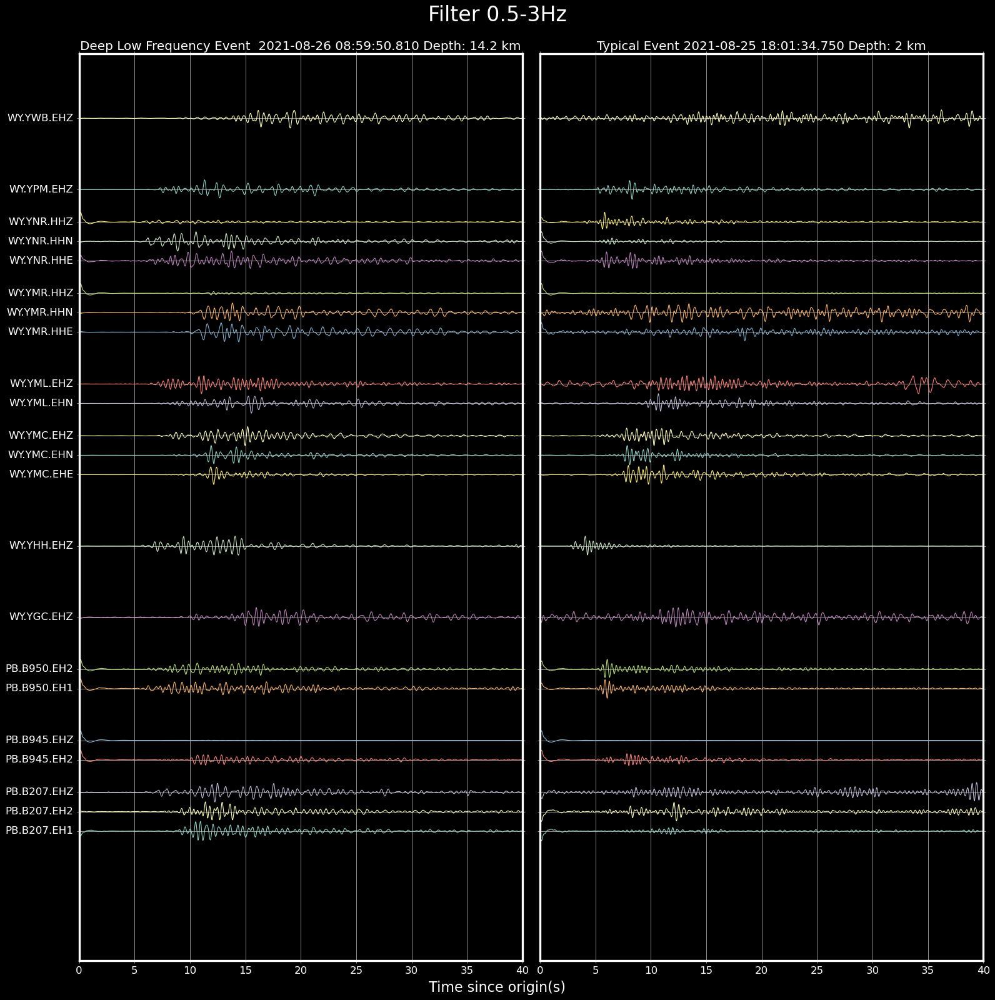

In [594]:
plot_record_section(0.5,3)

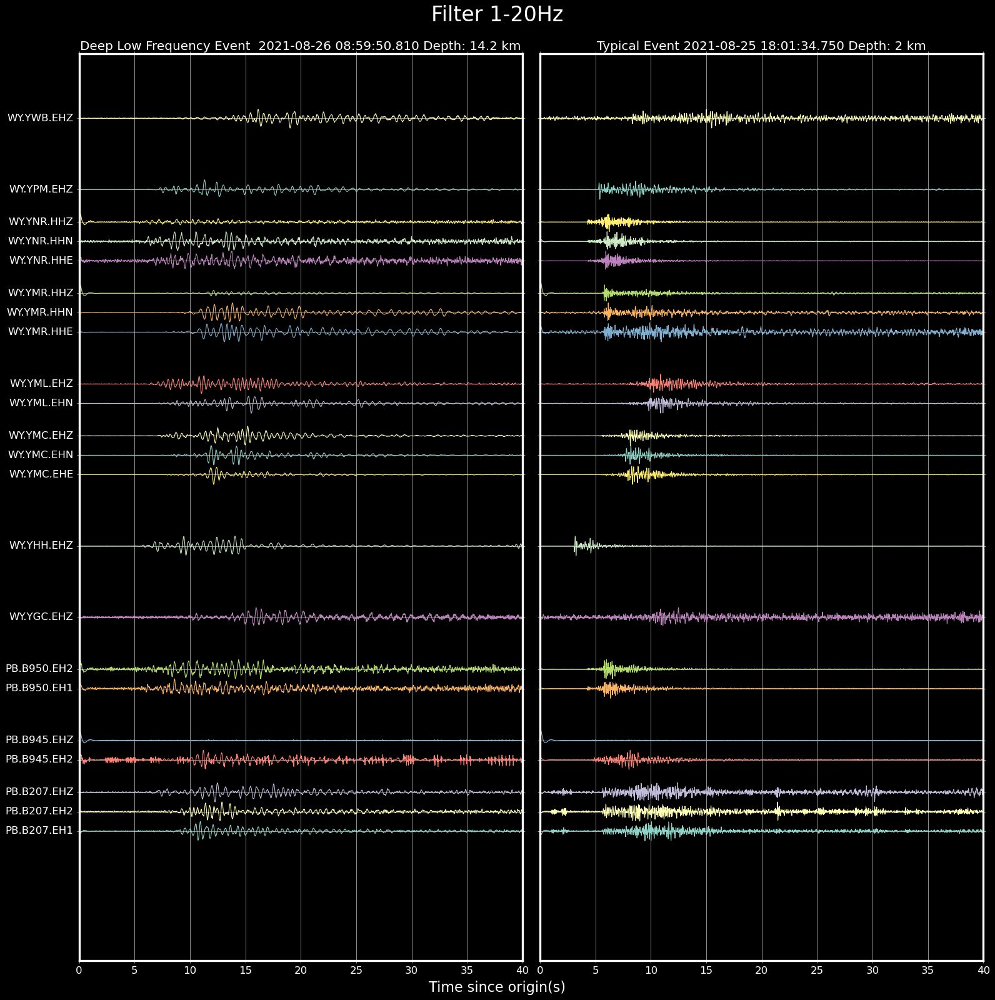

In [556]:
plot_record_section(1,20)


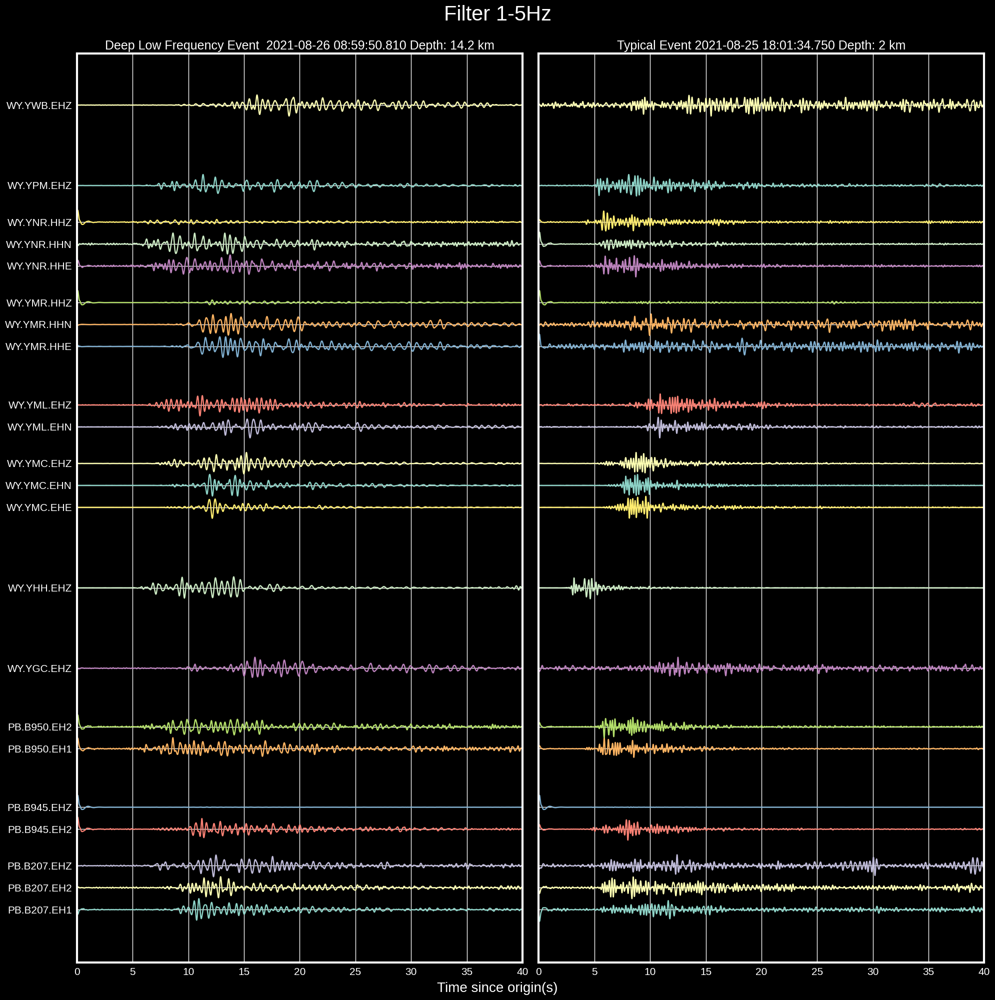

In [880]:
plot_record_section(1,5)

In [558]:
YMC_dlf = nice_s.select(station='YMC')
YMC_te = s_te.select(station='YMC')

In [562]:
YMC_dlf_noise = YMC_dlf.copy().trim(origin_time-60,origin_time)
YMC_dlf_signal = YMC_dlf.copy().trim(origin_time,origin_time+60)
YMC_te_noise = YMC_te.copy().trim(st_time-60,st_time)
YMC_te_signal = YMC_te.copy().trim(st_time,st_time+60)

In [599]:
freq = np.fft.fftfreq(len(YMC_dlf_noise[0].data),1/100)
YMC_dlf_noise_z = np.fft.fft(YMC_dlf_noise[0].data)
YMC_dlf_signal_z = np.fft.fft(YMC_dlf_signal[0].data)

YMC_dlf_noise_e = np.fft.fft(YMC_dlf_noise[1].data)
YMC_dlf_signal_e = np.fft.fft(YMC_dlf_signal[1].data)

YMC_dlf_noise_n = np.fft.fft(YMC_dlf_noise[2].data)
YMC_dlf_signal_n = np.fft.fft(YMC_dlf_signal[2].data)

YMC_te_noise_z = np.fft.fft(YMC_te_noise[0].data)
YMC_te_signal_z = np.fft.fft(YMC_te_signal[0].data)

YMC_te_noise_e = np.fft.fft(YMC_te_noise[1].data)
YMC_te_signal_e = np.fft.fft(YMC_te_signal[1].data)

YMC_te_noise_n = np.fft.fft(YMC_te_noise[2].data)
YMC_te_signal_n = np.fft.fft(YMC_te_signal[2].data)

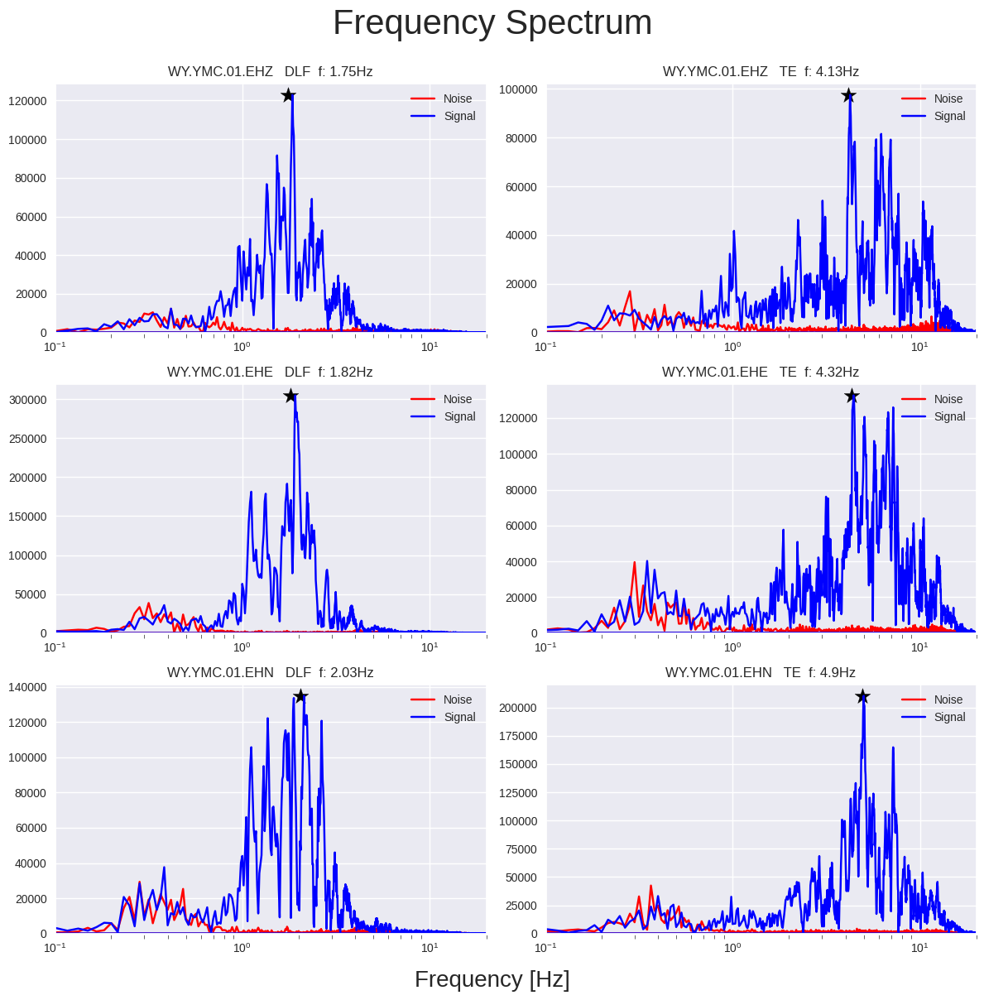

In [680]:
plt.style.use('seaborn')
fig, ax= plt.subplots(3,2,figsize=[12,12])

ax[0,0].plot(freq,np.abs(YMC_dlf_noise_z),label='Noise',c='r')
ax[0,0].plot(freq,np.abs(YMC_dlf_signal_z),label='Signal',c='b')
ax[0,0].set_xscale('log')
ax[0,0].tick_params(which='minor',length=4)
ax[0,0].set_xlim(0.1,20)
ax[0,0].scatter(freq[np.argmax(np.abs(YMC_dlf_signal_z[6:3000]))],np.max(np.abs(YMC_dlf_signal_z[6:3000])),s=200,marker='*',c='k')
ax[0,0].spines["bottom"].set_linewidth(2)
ax[0,0].spines["top"].set_linewidth(2)
ax[0,0].spines["left"].set_linewidth(2)
ax[0,0].spines["right"].set_linewidth(2)
ax[0,0].legend()
ax[0,0].set_ylim(bottom=0)
ax[0,0].set_title('WY.YMC.01.EHZ   DLF  f: '+str(np.around(freq[np.argmax(np.abs(YMC_dlf_signal_z[6:3000]))],2))+'Hz')


ax[0,1].plot(freq,np.abs(YMC_te_noise_z),label='Noise',c='r')
ax[0,1].plot(freq,np.abs(YMC_te_signal_z),label='Signal',color='b')
ax[0,1].set_xscale('log')
ax[0,1].tick_params(which='minor',length=4)
ax[0,1].set_xlim(0.1,20)
ax[0,1].scatter(freq[np.argmax(np.abs(YMC_te_signal_z[6:3000]))],np.max(np.abs(YMC_te_signal_z[6:3000])),s=200,marker='*',c='k')
ax[0,1].spines["bottom"].set_linewidth(2)
ax[0,1].spines["top"].set_linewidth(2)
ax[0,1].spines["left"].set_linewidth(2)
ax[0,1].spines["right"].set_linewidth(2)
ax[0,1].legend()
ax[0,1].set_ylim(bottom=0)
ax[0,1].set_title('WY.YMC.01.EHZ   TE  f: '+str(np.around(freq[np.argmax(np.abs(YMC_te_signal_z[6:3000]))],2))+'Hz')


ax[1,0].plot(freq,np.abs(YMC_dlf_noise_e),label='Noise',c='r')
ax[1,0].plot(freq,np.abs(YMC_dlf_signal_e),label='Signal',c='b')
ax[1,0].set_xscale('log')
ax[1,0].tick_params(which='minor',length=4)
ax[1,0].set_xlim(0.1,20)
ax[1,0].scatter(freq[np.argmax(np.abs(YMC_dlf_signal_e[6:3000]))],np.max(np.abs(YMC_dlf_signal_e[6:3000])),s=200,marker='*',c='k')
ax[1,0].spines["bottom"].set_linewidth(2)
ax[1,0].spines["top"].set_linewidth(2)
ax[1,0].spines["left"].set_linewidth(2)
ax[1,0].spines["right"].set_linewidth(2)
ax[1,0].legend()
ax[1,0].set_ylim(bottom=0)
ax[1,0].set_title('WY.YMC.01.EHE   DLF  f: '+str(np.around(freq[np.argmax(np.abs(YMC_dlf_signal_e[6:3000]))],2))+'Hz')

ax[1,1].plot(freq,np.abs(YMC_te_noise_e),label='Noise',c='r')
ax[1,1].plot(freq,np.abs(YMC_te_signal_e),label='Signal',c='b')
ax[1,1].set_xscale('log')
ax[1,1].tick_params(which='minor',length=4)
ax[1,1].set_xlim(0.1,20)
ax[1,1].scatter(freq[np.argmax(np.abs(YMC_te_signal_e[6:3000]))],np.max(np.abs(YMC_te_signal_e[6:3000])),s=200,marker='*',c='k')
ax[1,1].spines["bottom"].set_linewidth(2)
ax[1,1].spines["top"].set_linewidth(2)
ax[1,1].spines["left"].set_linewidth(2)
ax[1,1].spines["right"].set_linewidth(2)
ax[1,1].legend()
ax[1,1].set_ylim(bottom=0)
ax[1,1].set_title('WY.YMC.01.EHE   TE  f: '+str(np.around(freq[np.argmax(np.abs(YMC_te_signal_e[6:3000]))],2))+'Hz')


ax[2,0].plot(freq,np.abs(YMC_dlf_noise_n),label='Noise',c='r')
ax[2,0].plot(freq,np.abs(YMC_dlf_signal_n),label='Signal',c='b')
ax[2,0].set_xscale('log')
ax[2,0].tick_params(which='minor',length=4)
ax[2,0].set_xlim(0.1,20)
ax[2,0].scatter(freq[np.argmax(np.abs(YMC_dlf_signal_n[6:3000]))],np.max(np.abs(YMC_dlf_signal_n[6:3000])),s=200,marker='*',c='k')
ax[2,0].spines["bottom"].set_linewidth(2)
ax[2,0].spines["top"].set_linewidth(2)
ax[2,0].spines["left"].set_linewidth(2)
ax[2,0].spines["right"].set_linewidth(2)
ax[2,0].legend()
ax[2,0].set_ylim(bottom=0)
ax[2,0].set_title('WY.YMC.01.EHN   DLF  f: '+str(np.around(freq[np.argmax(np.abs(YMC_dlf_signal_n[6:3000]))],2))+'Hz')


ax[2,1].plot(freq,np.abs(YMC_te_noise_n),label='Noise',c='r')
ax[2,1].plot(freq,np.abs(YMC_te_signal_n),label='Signal',c='b')
ax[2,1].set_xscale('log')
ax[2,1].tick_params(which='minor',length=4)
ax[2,1].set_xlim(0.1,20)
ax[2,1].scatter(freq[np.argmax(np.abs(YMC_te_signal_n[6:3000]))],np.max(np.abs(YMC_te_signal_n[6:3000])),s=200,marker='*',c='k')
ax[2,1].spines["bottom"].set_linewidth(2)
ax[2,1].spines["top"].set_linewidth(2)
ax[2,1].spines["left"].set_linewidth(2)
ax[2,1].spines["right"].set_linewidth(2)
ax[2,1].legend()
ax[2,1].set_ylim(bottom=0)
ax[2,1].set_title('WY.YMC.01.EHN   TE  f: '+str(np.around(freq[np.argmax(np.abs(YMC_te_signal_n[6:3000]))],2))+'Hz')

fig.supxlabel('Frequency [Hz]',fontsize=20)
fig.suptitle('Frequency Spectrum',fontsize=30,y=1)
plt.tight_layout()

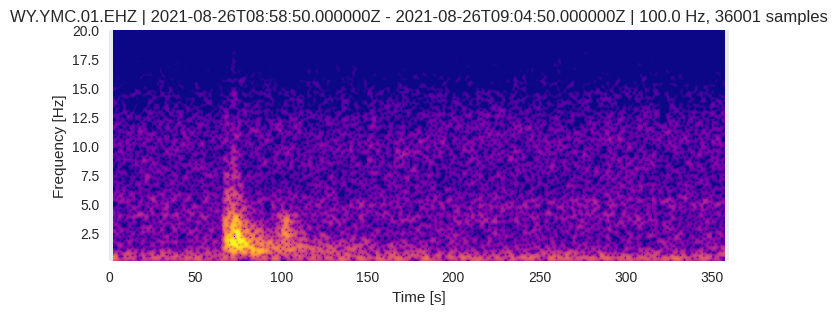

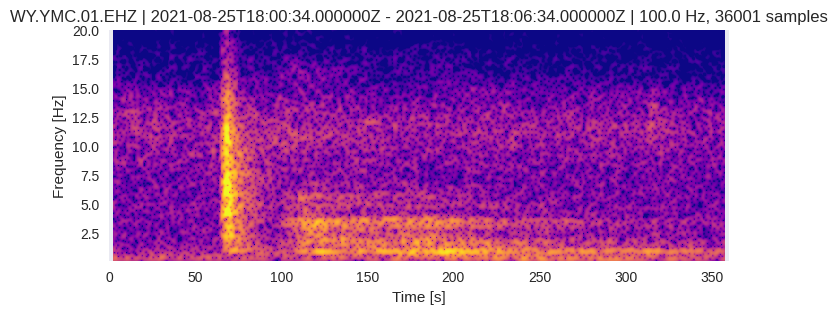

In [700]:
plt.rcParams['figure.figsize'] = 8,3
fig = YMC_dlf[0].copy().spectrogram(show=False,wlen=5,dbscale=True,cmap='plasma')
ax = fig.axes[0]
ax.set_ylim(0.1,20)
#ax.set_xlim(400,800)
im = ax.images[0]
im.set_clim(vmin=-10,vmax=50)
#ax.set_xlim(50,150)

fig = YMC_te[0].copy().spectrogram(show=False,wlen=5,dbscale=True,cmap='plasma')
ax = fig.axes[0]
ax.set_ylim(0.1,20)
#ax.set_xlim(400,800)
im = ax.images[0]
im.set_clim(vmin=-10,vmax=50)
#ax.set_xlim(50,150)

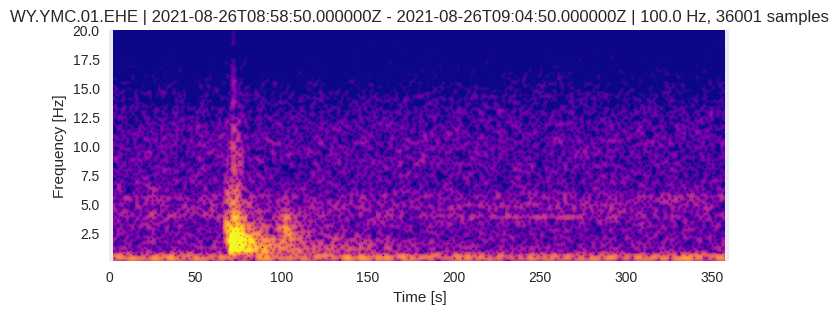

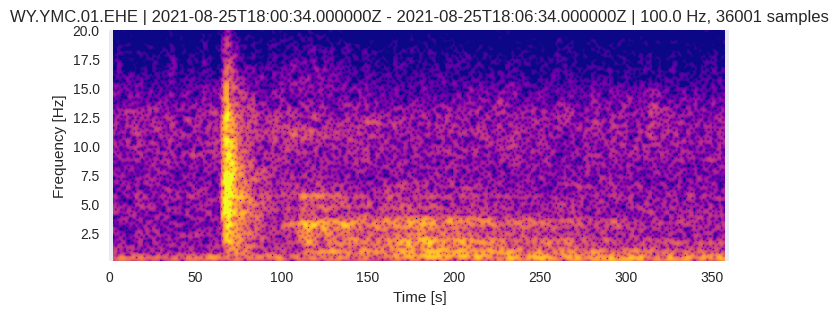

In [699]:
plt.rcParams['figure.figsize'] = 8,3
fig = YMC_dlf[1].copy().spectrogram(show=False,wlen=5,dbscale=True,cmap='plasma')
ax = fig.axes[0]
ax.set_ylim(0.1,20)
#ax.set_xlim(400,800)
im = ax.images[0]
im.set_clim(vmin=-10,vmax=50)
#ax.set_xlim(50,150)

fig = YMC_te[1].copy().spectrogram(show=False,wlen=5,dbscale=True,cmap='plasma')
ax = fig.axes[0]
ax.set_ylim(0.1,20)
#ax.set_xlim(400,800)
im = ax.images[0]
im.set_clim(vmin=-10,vmax=50)
#ax.set_xlim(50,150)

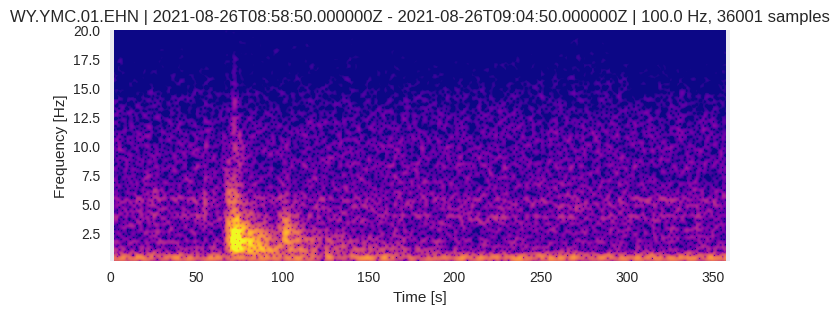

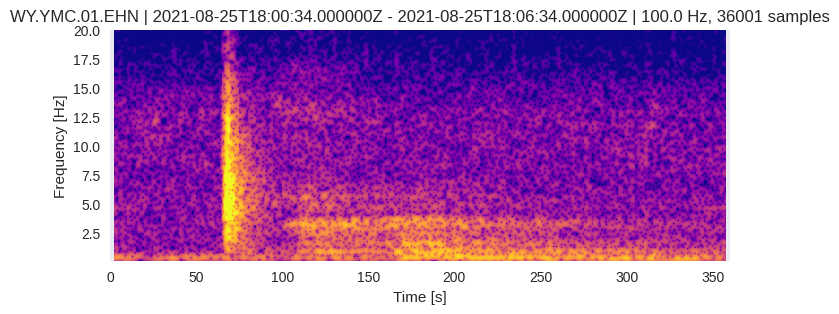

In [701]:
plt.rcParams['figure.figsize'] = 8,3
fig = YMC_dlf[2].copy().spectrogram(show=False,wlen=5,dbscale=True,cmap='plasma')
ax = fig.axes[0]
ax.set_ylim(0.1,20)
#ax.set_xlim(400,800)
im = ax.images[0]
im.set_clim(vmin=-10,vmax=50)
#ax.set_xlim(50,150)

fig = YMC_te[2].copy().spectrogram(show=False,wlen=5,dbscale=True,cmap='plasma')
ax = fig.axes[0]
ax.set_ylim(0.1,20)
#ax.set_xlim(400,800)
im = ax.images[0]
im.set_clim(vmin=-10,vmax=50)
#ax.set_xlim(50,150)

In [268]:
stns,network

(['B207',
  'B945',
  'B950',
  'YGC',
  'YHH',
  'YMC',
  'YML',
  'YMR',
  'YNR',
  'YPM',
  'YWB',
  'B207',
  'B945',
  'B950',
  'YMC',
  'YML',
  'YMR',
  'YNR',
  'B207',
  'B945',
  'B950',
  'YMC',
  'YML',
  'YMR',
  'YNR'],
 ['PB',
  'PB',
  'PB',
  'WY',
  'WY',
  'WY',
  'WY',
  'WY',
  'WY',
  'WY',
  'WY',
  'PB',
  'PB',
  'PB',
  'WY',
  'WY',
  'WY',
  'WY',
  'PB',
  'PB',
  'PB',
  'WY',
  'WY',
  'WY',
  'WY'])

In [269]:
inv = obspy.Inventory([])
for i in range(len(stns)):
    inv += client.get_stations(network=network[i],station=stns[i],starttime=origin_time,endtime=origin_time+300)

In [270]:
stn_lats = []
stn_lons = []
for i in range(len(stns)):
    if inv.networks[i].stations[0].code != 'B950':
        stn_lats.append(inv[i].stations[0].latitude)
        stn_lons.append(inv[i].stations[0].longitude)
    
stnlats = np.array(stn_lats)
stnlons = np.array(stn_lons)

In [271]:
stntexts = []
for i in range(len(stns)):
    if inv.networks[i].stations[0].code != 'B950':
        stntexts.append(network[i]+'.'+stns[i])
stntexts = np.array(stntexts)

In [272]:
import pygmt

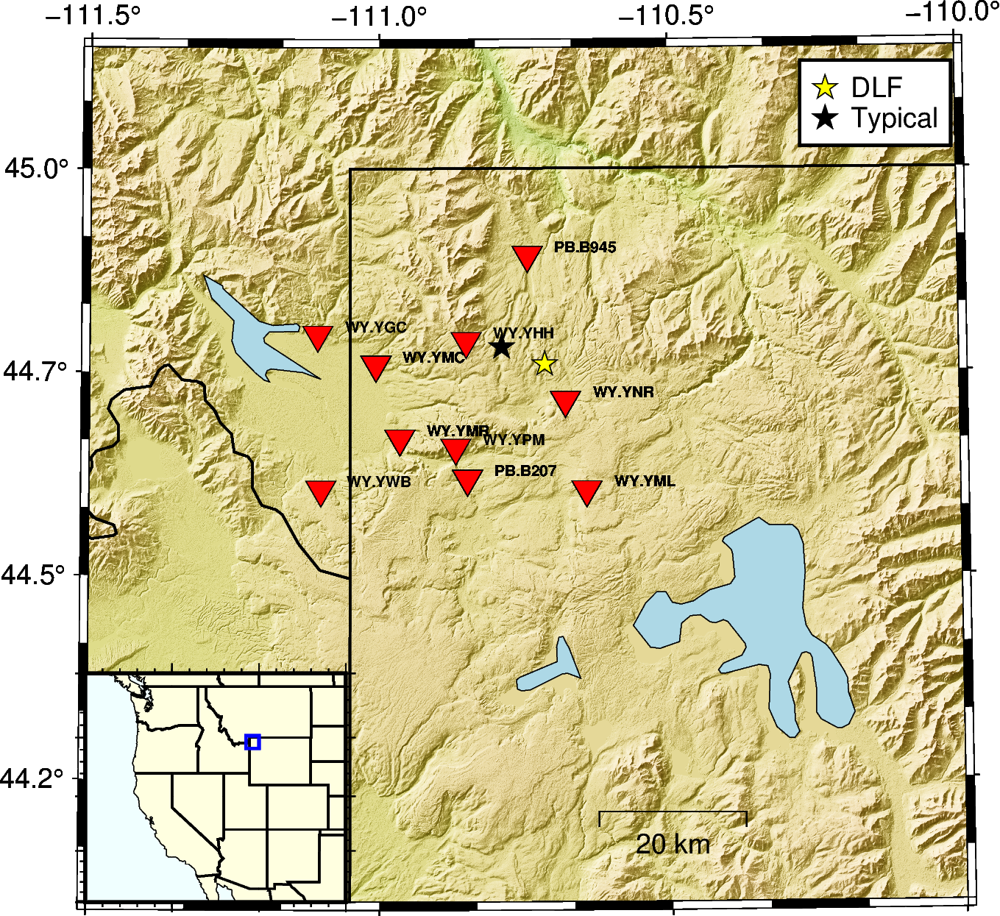

In [309]:
region=[-111.5,-110, 44.1, 45.15]
fig = pygmt.Figure()


pygmt.makecpt(cmap='topo',series='-10000/10000/1000',continuous=True)
pygmt.config(FORMAT_GEO_MAP="ddd.x")
topo_data = '@earth_relief_01s'

fig.grdimage(grid=topo_data,region=region,projection='S-111/90/4i',shading=True,frame=["WNse", "xaf", "yaf"])



fig.coast(
    shorelines=True,water="lightblue",borders=["2/thin","1/thin"],resolution='h',frame=["WNse", "xaf", "yaf"], map_scale='"g-110.5/44.2+w20"')

fig.plot(
    x=stnlons,
    y=stnlats,
    style='i0.4c',
    color='red',
    pen='black',
)

dlf_lat = 44.760
dlf_lon = -110.715

fig.plot(
    x=dlf_lon,
    y=dlf_lat,
    style= 'a0.3c',
    color = 'yellow',
    pen='black',
    label=f"DLF",
)

te_lat = 44.781
te_lon = -110.789
fig.plot(
    x=te_lon,
    y=te_lat,
    style= 'a0.3c',
    color = 'black',
    pen='black',
    label=f"Typical",
)


fig.text(text=stntexts,y=stnlats+0.01,x=stnlons+0.1,font="5p,Helvetica-Bold,black")
fig.legend()


with fig.inset(position="jBL+w3c+o0.0c/0.0c", box=False,no_clip=True):
    
    
    pygmt.config(FORMAT_GEO_MAP="ddd.x", MAP_FRAME_TYPE="plain")
    topo_data = '@earth_relief_01m'
    proj = 'M3c'
    reg1 = [-130, -100, 30, 50]
    #fig.grdimage(grid=topo_data,region=reg1,projection=proj,shading=True,
    #            frame=["wsne", "xaf", "yaf"])
    rectangle = [[region[0], region[2], region[1], region[3]]]
   
    fig.coast(
        area_thresh = 10000,
        region=reg1,
        projection=proj,
        borders=['1/thin','2/thin'],
        shorelines=True,
        land = "lightyellow",
        lakes=False,
        water="azure1",
    frame=["wsne", "xaf", "yaf"],
    resolution='l')
    fig.plot(data=rectangle, style="r+s", pen="1p,blue")
fig.show()

In [869]:
stntexts = []
for i in range(len(stns)):
    if inv.networks[i].stations[0].code != 'B950':
        stntexts.append(network[i]+'.'+stns[i])
stntexts = np.array(stntexts)

In [870]:
stntexts

array(['PB.B945', 'PB.B207', 'WY.YNR', 'WY.YNR', 'WY.YMR', 'WY.YML',
       'WY.YPM', 'WY.YMC', 'WY.YML', 'WY.YGC', 'WY.YMR', 'WY.YWB',
       'PB.B207', 'WY.YMR', 'WY.YMC', 'WY.YNR', 'PB.B207', 'WY.YHH',
       'WY.YMC', 'PB.B945'],
      dtype='<U7')

In [839]:
np.delete(stnlats,4)
np.delete(stnlons,4)
np.delete(stntexts,4)

array(['PB.B945', 'PB.B207', 'WY.YNR', 'WY.YNR', 'WY.YMR', 'WY.YML',
       'WY.YPM', 'WY.YMC', 'PB.B950', 'WY.YML', 'WY.YGC', 'WY.YMR',
       'WY.YWB', 'PB.B207', 'WY.YMR', 'WY.YMC', 'WY.YNR', 'PB.B207',
       'WY.YHH', 'WY.YMC', 'PB.B945'],
      dtype='<U7')

In [840]:
np.delete(stnlats,8)
np.delete(stnlons,8)
np.delete(stntexts,8)

array(['PB.B945', 'PB.B207', 'WY.YNR', 'WY.YNR', 'PB.B950', 'WY.YMR',
       'WY.YML', 'WY.YPM', 'PB.B950', 'WY.YML', 'WY.YGC', 'WY.YMR',
       'WY.YWB', 'PB.B207', 'WY.YMR', 'WY.YMC', 'WY.YNR', 'PB.B207',
       'WY.YHH', 'WY.YMC', 'PB.B945'],
      dtype='<U7')

In [866]:
inv.networks[0].stations[0].code

'B945'

In [881]:
len(nice_s)

22

In [882]:
len(s)

58

In [126]:
s_te1 = s_te.copy()
s_te1.rotate(method='NE->RT')

25 Trace(s) in Stream:

PB.B207..EHZ | 2021-08-25T18:00:34.008400Z - 2021-08-25T18:06:33.998400Z | 100.0 Hz, 36000 samples
...
(23 other traces)
...
WY.YNR.01.HHT | 2021-08-25T18:00:34.008393Z - 2021-08-25T18:06:33.998393Z | 100.0 Hz, 36000 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]

In [127]:
s_te1

25 Trace(s) in Stream:

PB.B207..EHZ | 2021-08-25T18:00:34.008400Z - 2021-08-25T18:06:33.998400Z | 100.0 Hz, 36000 samples
...
(23 other traces)
...
WY.YNR.01.HHT | 2021-08-25T18:00:34.008393Z - 2021-08-25T18:06:33.998393Z | 100.0 Hz, 36000 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]